# NVIDIA AI Developers Day
## NVIDIA Inference Technology:<br> Deep-dive on TensorRT, Transfer Learning Toolkit and Deepstream
This notebook shows an example usecase of SSD object detection inference.<br>
[TensorRT (Session1)](#head-a) and [Transfer learning toolkit (Session2)](#head-b) will help you to optimize and quantize your network. <br>
And Deepstream will be great framework for your Real-time Intelligent Video Analysis application.



## [Session 2. Transfer Learning Toolkit]

![Overview of Transfer Learning Toolkit](tlt_figures/TLT-0_overview.PNG)

# TLT SSD example usecase

This notebook shows an example usecase of SSD object detection using Transfer Learning Toolkit.

0. [Set up env variables](#head-0)
1. [Prepare dataset and pre-trained model](#head-1) <br>
    1.1 [Prepare tfrecords from kitti format dataset](#head-1-1) <br>
    1.2 [Download pre-trained model](#head-1-2) <br>
2. [Provide training specification](#head-2)
3. [Run TLT training](#head-3)
4. [Evaluate trained models](#head-4)
5. [Prune trained models](#head-5)
6. [Retrain pruned models](#head-6)
7. [Evaluate retrained model](#head-7)
8. [Visualize inferences](#head-8)
9. [Deploy](#head-9)
10. [Convert TRT](#head-10)
11. [References](#head-11)


## 0. Set up env variables <a class="anchor" id="head-0"></a>


In [37]:
# Setting up env variables for cleaner command line commands.
print("Please replace the variable with your key.")
%set_env KEY=$KEY
%set_env USER_EXPERIMENT_DIR=/workspace/tlt-experiments
%set_env DATA_DOWNLOAD_DIR=/workspace/tlt-experiments/data
%set_env SPECS_DIR=/workspace/examples/ssd/specs
!mkdir -p $DATA_DOWNLOAD_DIR

Please replace the variable with your key.
env: KEY=$KEY
env: USER_EXPERIMENT_DIR=/workspace/tlt-experiments
env: DATA_DOWNLOAD_DIR=/workspace/tlt-experiments/data
env: SPECS_DIR=/workspace/examples/ssd/specs


## 1. Prepare dataset and pre-trained model <a class="anchor" id="head-1"></a>

![Prepare dataset](tlt_figures/TLT-2_dataset_conversion.PNG)

 We will be using the KITTI detection dataset for the tutorial. To find more details please visit
 http://www.cvlibs.net/datasets/kitti/eval_object.php?obj_benchmark=2d. Please download the KITTI detection images (http://www.cvlibs.net/download.php?file=data_object_image_2.zip) and labels (http://www.cvlibs.net/download.php?file=data_object_label_2.zip) to $DATA_DOWNLOAD_DIR.

In [2]:
# Check the dataset is present
!mkdir -p $DATA_DOWNLOAD_DIR
!if [ ! -f $DATA_DOWNLOAD_DIR/data_object_image_2.zip ]; then echo 'Image zip file not found, please download.'; else echo 'Found Image zip file.';fi
!if [ ! -f $DATA_DOWNLOAD_DIR/data_object_label_2.zip ]; then echo 'Label zip file not found, please download.'; else echo 'Found Labels zip file.';fi

Found Image zip file.
Found Labels zip file.


In [3]:
# unpack 
!unzip -u $DATA_DOWNLOAD_DIR/data_object_image_2.zip -d $DATA_DOWNLOAD_DIR
!unzip -u $DATA_DOWNLOAD_DIR/data_object_label_2.zip -d $DATA_DOWNLOAD_DIR

Archive:  /workspace/tlt-experiments/data/data_object_image_2.zip
Archive:  /workspace/tlt-experiments/data/data_object_label_2.zip


In [4]:
# verify
!ls -l $DATA_DOWNLOAD_DIR/

total 12280840
drwxrwxrwx  4 root root        4096 Oct  2 06:43 KITTI
-rwxrwxrwx  1 1001 1001 12569945557 May 11  2018 data_object_image_2.zip
-rwxrwxrwx  1 1001 1001     5601213 May 11  2018 data_object_label_2.zip
drwxrwxrwx  3 root root        4096 Oct  2 23:52 faster_rcnn
drwxrwxrwx  2 root root        4096 Oct  4 09:12 ssd
drwxrwxrwx  3 1001 1001        4096 Sep 30 06:40 testing
drwxrwxrwx 33 root root        4096 Oct 22 08:51 tlt-experiments
drwxrwxrwx  4 root root        4096 Oct  3 00:32 training


Additionally, if you have your own dataset already in a volume (or folder), you can mount the volume on `DATA_DOWNLOAD_DIR` (or create a soft link). Below shows an example:
```bash
# if your dataset is in /dev/sdc1
mount /dev/sdc1 $DATA_DOWNLOAD_DIR

# if your dataset is in folder /var/dataset
ln -sf /var/dataset $DATA_DOWNLOAD_DIR
```

### 1.1 Prepare tfrecords from kitti format dataset <a class="anchor" id="head-1-1"></a>

* Update the tfrecords spec file to take in your kitti format dataset
* Create the tfrecords using the tlt-dataset-convert 
* TFRecords only need to be generated once.

In [5]:
print("TFrecords conversion spec file for training")
!cat $SPECS_DIR/ssd_tfrecords_kitti_trainval.txt

TFrecords conversion spec file for training
kitti_config {
  root_directory_path: "/workspace/tlt-experiments/data/training"
  image_dir_name: "image_2"
  label_dir_name: "label_2"
  image_extension: ".png"
  partition_mode: "random"
  num_partitions: 2
  val_split: 14
  num_shards: 10
}
image_directory_path: "/workspace/tlt-experiments/data/training"

In [6]:
# Creating a new directory for the output tfrecords dump.
!mkdir -p $USER_EXPERIMENT_DIR/tfrecords
#KITTI trainval
!tlt-dataset-convert -d $SPECS_DIR/ssd_tfrecords_kitti_trainval.txt \
                     -o $USER_EXPERIMENT_DIR/tfrecords/kitti_trainval

Using TensorFlow backend.
2019-10-22 11:06:26,163 - iva.detectnet_v2.dataio.build_converter - INFO - Instantiating a kitti converter
2019-10-22 11:06:26,188 - iva.detectnet_v2.dataio.kitti_converter_lib - INFO - Num images in
Train: 6434	Val: 1047
2019-10-22 11:06:26,188 - iva.detectnet_v2.dataio.kitti_converter_lib - INFO - Validation data in partition 0. Hence, while choosing the validationset during training choose validation_fold 0.
2019-10-22 11:06:26,192 - iva.detectnet_v2.dataio.dataset_converter_lib - INFO - Writing partition 0, shard 0
/usr/local/lib/python2.7/dist-packages/iva/detectnet_v2/dataio/kitti_converter_lib.py:266: VisibleDeprecationWarning: Reading unicode strings without specifying the encoding argument is deprecated. Set the encoding, use None for the system default.
2019-10-22 11:06:26,336 - iva.detectnet_v2.dataio.dataset_converter_lib - INFO - Writing partition 0, shard 1
2019-10-22 11:06:26,475 - iva.detectnet_v2.dataio.dataset_converter_lib - INFO - Writing p

In [7]:
!ls -rlt $USER_EXPERIMENT_DIR/tfrecords/

total 7148
-rwxrwxrwx 1 root root 103350 Oct 22 11:06 kitti_trainval-fold-000-of-002-shard-00000-of-00010
-rwxrwxrwx 1 root root 102479 Oct 22 11:06 kitti_trainval-fold-000-of-002-shard-00001-of-00010
-rwxrwxrwx 1 root root 102131 Oct 22 11:06 kitti_trainval-fold-000-of-002-shard-00002-of-00010
-rwxrwxrwx 1 root root 104707 Oct 22 11:06 kitti_trainval-fold-000-of-002-shard-00003-of-00010
-rwxrwxrwx 1 root root 101860 Oct 22 11:06 kitti_trainval-fold-000-of-002-shard-00004-of-00010
-rwxrwxrwx 1 root root  99269 Oct 22 11:06 kitti_trainval-fold-000-of-002-shard-00005-of-00010
-rwxrwxrwx 1 root root 103893 Oct 22 11:06 kitti_trainval-fold-000-of-002-shard-00006-of-00010
-rwxrwxrwx 1 root root  95751 Oct 22 11:06 kitti_trainval-fold-000-of-002-shard-00007-of-00010
-rwxrwxrwx 1 root root 103400 Oct 22 11:06 kitti_trainval-fold-000-of-002-shard-00008-of-00010
-rwxrwxrwx 1 root root 103111 Oct 22 11:06 kitti_trainval-fold-000-of-002-shard-00009-of-00010
-rwxrwxrwx 1 root root 627323 Oct 22 11

### 1.2 Download pre-trained model <a class="anchor" id="head-1-2"></a>

![pre-trained model](tlt_figures/TLT-1_download_model.PNG)

We will use NGC CLI to get the pre-trained models. For more details, go to [ngc.nvidia.com](ngc.nvidia.com) and click the SETUP on the navigation bar.

In [8]:
!ngc registry model list nvidia/iva/tlt_*_ssd 

+---------+---------+---------+---------+---------+---------+---------+---------+
| Name    | Reposit | Latest  | Applica | Framewo | Precisi | Last Mo | Permiss |
|         | ory     | Version | tion    | rk      | on      | dified  | ion     |
+---------+---------+---------+---------+---------+---------+---------+---------+
| TLT Res | nvidia/ | 1       | Object  | Transfe | FP32    | Oct 18, | unlocke |
| Net10   | iva/tlt |         | Detecti | r Learn |         | 2019    | d       |
| SSD     | _resnet |         | on      | ing     |         |         |         |
|         | 10_ssd  |         |         | Toolkit |         |         |         |
| TLT Res | nvidia/ | 1       | Object  | Transfe | FP32    | Oct 18, | unlocke |
| Net18   | iva/tlt |         | Detecti | r Learn |         | 2019    | d       |
| SSD     | _resnet |         | on      | ing     |         |         |         |
|         | 18_ssd  |         |         | Toolkit |         |         |         |
+---------+-----

In [9]:
!mkdir -p $USER_EXPERIMENT_DIR/pretrained_resnet18/

In [10]:
# Pull pretrained model from NGC
!ngc registry model download-version nvidia/iva/tlt_resnet18_ssd:1 -d $USER_EXPERIMENT_DIR/pretrained_resnet18 

Downloaded 82.41 MB in 11s, Download speed: 7.48 MB/s               
----------------------------------------------------
Transfer id: tlt_resnet18_ssd_v1 Download status: Completed.
Downloaded local path: /workspace/tlt-experiments/pretrained_resnet18/tlt_resnet18_ssd_v1-4
Total files downloaded: 2 
Total downloaded size: 82.41 MB
Started at: 2019-10-22 11:06:45.700566
Completed at: 2019-10-22 11:06:56.721970
Duration taken: 11s seconds
----------------------------------------------------


In [11]:
print("Check that model is downloaded into dir.")
!ls -l $USER_EXPERIMENT_DIR/pretrained_resnet18/tlt_resnet18_ssd_v1

Check that model is downloaded into dir.
total 91164
-rwxrwxrwx 1 root root      253 Oct  4 06:18 license.txt
-rwxrwxrwx 1 root root 93345064 Oct  4 06:18 resnet18.hdf5


## 2. Provide training specification <a class="anchor" id="head-2"></a>
* Tfrecords for the train datasets
    * In order to use the newly generated tfrecords, update the dataset_config parameter in the spec file at `$SPECS_DIR/ssd_train_resnet18_kitti.txt` 
    * Update the fold number to use for evaluation. In case of random data split, please use fold 0 only
    * For sequence wise you may use any fold generated from the dataset convert tool
* Pre-trained models
* Augmentation parameters for on the fly data augmentation
* Other training (hyper-)parameters such as batch size, number of epochs, learning rate etc.

In [12]:
!cat $SPECS_DIR/ssd_train_resnet18_kitti.txt

ssd_config {
  aspect_ratios_global: "[1.0, 2.0, 0.5, 3.0, 1.0/3.0]"
  scales: "[0.05, 0.1, 0.25, 0.4, 0.55, 0.7, 0.85]"
  two_boxes_for_ar1: true
  clip_boxes: false
  loss_loc_weight: 0.8
  focal_loss_alpha: 0.25
  focal_loss_gamma: 2.0
  variances: "[0.1, 0.1, 0.2, 0.2]"
  arch: "resnet18"
  freeze_bn: false
  freeze_blocks: 0
}
training_config {
  batch_size_per_gpu: 16
  num_epochs: 180
  learning_rate {
  soft_start_annealing_schedule {
    min_learning_rate: 5e-5
    max_learning_rate: 2e-2
    soft_start: 0.1
    annealing: 0.3
    }
  }
  regularizer {
    type: L1
    weight: 3.00000002618e-09
  }
}
eval_config {
  validation_period_during_training: 10
  average_precision_mode: SAMPLE
  batch_size: 32
  matching_iou_threshold: 0.5
}
nms_config {
  confidence_threshold: 0.01
  clustering_iou_threshold: 0.6
  top_k: 200
} 
augmentation_config {
  preprocessing {
    output_image_width: 1248
    output_image_height: 384
    output_image_channel: 3
    crop_right: 1248
    crop_b

## 3. Run TLT training <a class="anchor" id="head-3"></a>
* Provide the sample spec file and the output directory location for models
* WARNING: training will take several hours or one day to complete

![Training](tlt_figures/TLT-3_training.PNG)

In [13]:
!mkdir -p $USER_EXPERIMENT_DIR/experiment_dir_unpruned

In [ ]:
!tlt-train ssd -e $SPECS_DIR/ssd_train_resnet18_kitti.txt \
               -r $USER_EXPERIMENT_DIR/experiment_dir_unpruned \
               -k $KEY \
               -m $USER_EXPERIMENT_DIR/pretrained_resnet18/tlt_resnet18_ssd_v1/resnet18.hdf5 

In [14]:
print("For multi-GPU, please uncomment and run this instead. Change --gpus based on your machine.")
!tlt-train ssd -e $SPECS_DIR/ssd_train_resnet18_kitti.txt \
               -r $USER_EXPERIMENT_DIR/experiment_dir_unpruned \
               -k $KEY \
               -m $USER_EXPERIMENT_DIR/pretrained_resnet18/tlt_resnet18_ssd_v1/resnet18.hdf5 \
               --gpus 8

For multi-GPU, please uncomment and run this instead. Change --gpus based on your machine.
Using TensorFlow backend.
Using TensorFlow backend.
Using TensorFlow backend.
Using TensorFlow backend.
Using TensorFlow backend.
Using TensorFlow backend.
Using TensorFlow backend.
Using TensorFlow backend.
2019-10-22 11:07:08.261547: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2019-10-22 11:07:08.261668: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2019-10-22 11:07:08.261720: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2019-10-22 11:07:08.261819: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2019-

2019-10-22 11:07:21.296831: I tensorflow/compiler/xla/service/service.cc:150] XLA service 0x69e4a60 executing computations on platform CUDA. Devices:
2019-10-22 11:07:21.296928: I tensorflow/compiler/xla/service/service.cc:158]   StreamExecutor device (0): Tesla V100-SXM2-16GB, Compute Capability 7.0
2019-10-22 11:07:21.296938: I tensorflow/compiler/xla/service/service.cc:158]   StreamExecutor device (1): Tesla V100-SXM2-16GB, Compute Capability 7.0
2019-10-22 11:07:21.296944: I tensorflow/compiler/xla/service/service.cc:158]   StreamExecutor device (2): Tesla V100-SXM2-16GB, Compute Capability 7.0
2019-10-22 11:07:21.296949: I tensorflow/compiler/xla/service/service.cc:158]   StreamExecutor device (3): Tesla V100-SXM2-16GB, Compute Capability 7.0
2019-10-22 11:07:21.296955: I tensorflow/compiler/xla/service/service.cc:158]   StreamExecutor device (4): Tesla V100-SXM2-16GB, Compute Capability 7.0
2019-10-22 11:07:21.296961: I tensorflow/compiler/xla/service/service.cc:158]   StreamExec

Instructions for updating:
Colocations handled automatically by placer.
2019-10-22 11:07:21,450 [WARNING] tensorflow: From /usr/local/lib/python2.7/dist-packages/tensorflow/python/data/ops/iterator_ops.py:358: colocate_with (from tensorflow.python.framework.ops) is deprecated and will be removed in a future version.
Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Colocations handled automatically by placer.
2019-10-22 11:07:21,452 [WARNING] tensorflow: From /usr/local/lib/python2.7/dist-packages/tensorflow/python/data/ops/iterator_ops.py:358: colocate_with (from tensorflow.python.framework.ops) is deprecated and will be removed in a future version.
Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Colocations handled automatically by placer.
2019-10-22 11:07:21,467 [WARNING] tensorflow: From /usr/local/lib/python2.7/dist-packages/tensorflow/python/data/ops/iterator_ops.py:358: colocate_w

target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is

target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
Instructions for upd

target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is

target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is

target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is

Instructions for updating:
Use tf.cast instead.
2019-10-22 11:08:11,710 [WARNING] tensorflow: From /usr/local/lib/python2.7/dist-packages/tensorflow/python/ops/math_ops.py:3066: to_int32 (from tensorflow.python.ops.math_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.cast instead.
Instructions for updating:
Use tf.cast instead.
2019-10-22 11:08:11,918 [WARNING] tensorflow: From /usr/local/lib/python2.7/dist-packages/tensorflow/python/ops/math_ops.py:3066: to_int32 (from tensorflow.python.ops.math_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.cast instead.
Instructions for updating:
Use tf.cast instead.
2019-10-22 11:08:12,464 [WARNING] tensorflow: From /usr/local/lib/python2.7/dist-packages/tensorflow/python/ops/math_ops.py:3066: to_int32 (from tensorflow.python.ops.math_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.cast instead.
Instructions for

Total params: 20,503,036
Trainable params: 20,481,916
Non-trainable params: 21,120
__________________________________________________________________________________________________
2019-10-22 11:13:09,862 [INFO] iva.ssd.scripts.train: Number of images in the training dataset:	  6434
2019-10-22 11:13:09,862 [INFO] iva.ssd.scripts.train: Number of images in the validation dataset:	  1047
Instructions for updating:
Deprecated in favor of operator or tf.math.divide.
2019-10-22 11:13:11,602 [WARNING] tensorflow: From /usr/local/lib/python2.7/dist-packages/horovod/tensorflow/__init__.py:91: div (from tensorflow.python.ops.math_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Deprecated in favor of operator or tf.math.divide.
Epoch 1/180
2019-10-22 11:13:36.215651: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: Val

2019-10-22 11:13:36.359448: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 11:13:36.359601: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/StridedReplace/strided_slice. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?,1]
2019-10-22 11:13:36.359639: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/strided_slice_4. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 11:13:36.359670: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed t

2019-10-22 11:13:36.492329: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 11:13:36.492458: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/StridedReplace/strided_slice. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?,1]
2019-10-22 11:13:36.492492: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/strided_slice_4. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 11:13:36.492523: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed t

2019-10-22 11:13:37.339126: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 11:13:37.339275: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/StridedReplace/strided_slice. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?,1]
2019-10-22 11:13:37.339313: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/strided_slice_4. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 11:13:37.339345: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed t

2019-10-22 11:13:37.344041: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_31/CornerCoordToCentroids/StridedReplace/strided_slice. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?,1]
2019-10-22 11:13:37.344078: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_31/CornerCoordToCentroids/strided_slice_4. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 11:13:37.344112: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_31/CornerCoordToCentroids/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 11:13:37.344149: W ./tensorflow/core/grappler/optimizers/graph_optimize

2019-10-22 11:13:37.623379: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 11:13:37.623497: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/StridedReplace/strided_slice. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?,1]
2019-10-22 11:13:37.623539: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/strided_slice_4. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 11:13:37.623574: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed t

2019-10-22 11:13:37.880133: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 11:13:37.880259: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/StridedReplace/strided_slice. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?,1]
2019-10-22 11:13:37.880299: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/strided_slice_4. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 11:13:37.880350: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed t

2019-10-22 11:13:41.760550: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 11:13:41.760657: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/StridedReplace/strided_slice. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?,1]
2019-10-22 11:13:41.760691: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/strided_slice_4. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 11:13:41.760720: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed t

2019-10-22 11:13:41.860668: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 11:13:41.860788: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/StridedReplace/strided_slice. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?,1]
2019-10-22 11:13:41.860823: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/strided_slice_4. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 11:13:41.860852: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed t

2019-10-22 11:13:42.066347: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 11:13:42.066459: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/StridedReplace/strided_slice. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?,1]
2019-10-22 11:13:42.066502: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/strided_slice_4. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 11:13:42.066536: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed t

2019-10-22 11:13:42.327700: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 11:13:42.327857: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/StridedReplace/strided_slice. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?,1]
2019-10-22 11:13:42.327893: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/strided_slice_4. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 11:13:42.327924: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed t

2019-10-22 11:13:43.575379: I tensorflow/stream_executor/dso_loader.cc:152] successfully opened CUDA library libcublas.so.10.0 locally
2019-10-22 11:13:43.585603: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 11:13:43.585725: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/StridedReplace/strided_slice. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?,1]
2019-10-22 11:13:43.585764: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/strided_slice_4. Error: ValidateStridedSliceOp returned

2019-10-22 11:13:43.786933: I tensorflow/stream_executor/dso_loader.cc:152] successfully opened CUDA library libcublas.so.10.0 locally
2019-10-22 11:13:43.906251: I tensorflow/stream_executor/dso_loader.cc:152] successfully opened CUDA library libcublas.so.10.0 locally
2019-10-22 11:13:44.004535: I tensorflow/core/kernels/cuda_solvers.cc:159] Creating CudaSolver handles for stream 0x5af3480
2019-10-22 11:13:44.137890: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 11:13:44.137997: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/StridedReplace/strided_slice. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?,1]
2019-10-22 1

2019-10-22 11:13:44.230786: I tensorflow/core/kernels/cuda_solvers.cc:159] Creating CudaSolver handles for stream 0x6bda0c0
2019-10-22 11:13:44.288066: I tensorflow/stream_executor/dso_loader.cc:152] successfully opened CUDA library libcublas.so.10.0 locally
2019-10-22 11:13:44.340763: I tensorflow/core/kernels/cuda_solvers.cc:159] Creating CudaSolver handles for stream 0x6183bf0
2019-10-22 11:13:44.533825: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 11:13:44.533957: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/StridedReplace/strided_slice. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?,1]
2019-10-22 11:13:44.533

2019-10-22 11:13:44.663470: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 11:13:44.663585: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/StridedReplace/strided_slice. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?,1]
2019-10-22 11:13:44.663629: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/strided_slice_4. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 11:13:44.663668: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed t

2019-10-22 11:13:44.796748: I tensorflow/core/kernels/cuda_solvers.cc:159] Creating CudaSolver handles for stream 0x77fd3a0
2019-10-22 11:13:45.706406: I tensorflow/stream_executor/dso_loader.cc:152] successfully opened CUDA library libcublas.so.10.0 locally
2019-10-22 11:13:46.169013: I tensorflow/core/kernels/cuda_solvers.cc:159] Creating CudaSolver handles for stream 0x59ca0e0
2019-10-22 11:13:46.385229: I tensorflow/stream_executor/dso_loader.cc:152] successfully opened CUDA library libcublas.so.10.0 locally
2019-10-22 11:13:46.878151: I tensorflow/stream_executor/dso_loader.cc:152] successfully opened CUDA library libcublas.so.10.0 locally
2019-10-22 11:13:46.915512: I tensorflow/core/kernels/cuda_solvers.cc:159] Creating CudaSolver handles for stream 0x6cb71b0
2019-10-22 11:13:46.987006: I tensorflow/stream_executor/dso_loader.cc:152] successfully opened CUDA library libcublas.so.10.0 locally
2019-10-22 11:13:47.488892: I tensorflow/core/kernels/cuda_solvers.cc:159] Creating Cuda

50/50 [==============================] - 32s 634ms/step - loss: 0.6984

Epoch 00026: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_026.tlt
Epoch 27/180
50/50 [==============================] - 31s 616ms/step - loss: 0.6707

Epoch 00027: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_027.tlt
Epoch 28/180
50/50 [==============================] - 31s 621ms/step - loss: 0.6557

Epoch 00028: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_028.tlt
Epoch 29/180
50/50 [==============================] - 32s 630ms/step - loss: 0.6353

Epoch 00029: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_029.tlt
Epoch 30/180
50/50 [==============================] - 31s 619ms/step - loss: 0.6240

Epoch 00030: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_030.tlt
Number of ima

50/50 [==============================] - 32s 631ms/step - loss: 0.4638

Epoch 00055: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_055.tlt
Epoch 56/180
50/50 [==============================] - 31s 628ms/step - loss: 0.4675

Epoch 00056: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_056.tlt
Epoch 57/180
50/50 [==============================] - 31s 618ms/step - loss: 0.4548

Epoch 00057: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_057.tlt
Epoch 58/180
50/50 [==============================] - 33s 666ms/step - loss: 0.4391

Epoch 00058: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_058.tlt
Epoch 59/180
50/50 [==============================] - 33s 664ms/step - loss: 0.4186

Epoch 00059: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_059.tlt
Epoch 60/180


50/50 [==============================] - 32s 630ms/step - loss: 0.3533

Epoch 00084: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_084.tlt
Epoch 85/180
50/50 [==============================] - 32s 641ms/step - loss: 0.3684

Epoch 00085: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_085.tlt
Epoch 86/180
50/50 [==============================] - 31s 630ms/step - loss: 0.3326

Epoch 00086: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_086.tlt
Epoch 87/180
50/50 [==============================] - 32s 631ms/step - loss: 0.3767

Epoch 00087: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_087.tlt
Epoch 88/180
50/50 [==============================] - 32s 636ms/step - loss: 0.3578

Epoch 00088: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_088.tlt
Epoch 89/180


50/50 [==============================] - 34s 678ms/step - loss: 0.3351

Epoch 00113: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_113.tlt
Epoch 114/180
50/50 [==============================] - 32s 632ms/step - loss: 0.3276

Epoch 00114: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_114.tlt
Epoch 115/180
50/50 [==============================] - 32s 638ms/step - loss: 0.3242

Epoch 00115: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_115.tlt
Epoch 116/180
50/50 [==============================] - 32s 644ms/step - loss: 0.3270

Epoch 00116: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_116.tlt
Epoch 117/180
50/50 [==============================] - 31s 629ms/step - loss: 0.3215

Epoch 00117: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_117.tlt
Epoch 118

Epoch 142/180
50/50 [==============================] - 32s 641ms/step - loss: 0.3342

Epoch 00142: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_142.tlt
Epoch 143/180
50/50 [==============================] - 32s 638ms/step - loss: 0.3243

Epoch 00143: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_143.tlt
Epoch 144/180
50/50 [==============================] - 33s 666ms/step - loss: 0.3148

Epoch 00144: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_144.tlt
Epoch 145/180
50/50 [==============================] - 32s 637ms/step - loss: 0.3177

Epoch 00145: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_145.tlt
Epoch 146/180
50/50 [==============================] - 32s 638ms/step - loss: 0.3363

Epoch 00146: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_146

Epoch 171/180
50/50 [==============================] - 32s 644ms/step - loss: 0.3246

Epoch 00171: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_171.tlt
Epoch 172/180
50/50 [==============================] - 32s 635ms/step - loss: 0.3257

Epoch 00172: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_172.tlt
Epoch 173/180
50/50 [==============================] - 32s 644ms/step - loss: 0.3357

Epoch 00173: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_173.tlt
Epoch 174/180
50/50 [==============================] - 32s 636ms/step - loss: 0.3093

Epoch 00174: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_174.tlt
Epoch 175/180
50/50 [==============================] - 32s 644ms/step - loss: 0.3369

Epoch 00175: saving model to /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_175

In [15]:
print('Model for each epoch:')
print('---------------------')
!ls -ltrh $USER_EXPERIMENT_DIR/experiment_dir_unpruned/weights

Model for each epoch:
---------------------
total 14G
-rwxrwxrwx 1 root root 79M Oct 22 11:15 ssd_resnet18_epoch_001.tlt
-rwxrwxrwx 1 root root 79M Oct 22 11:16 ssd_resnet18_epoch_002.tlt
-rwxrwxrwx 1 root root 79M Oct 22 11:16 ssd_resnet18_epoch_003.tlt
-rwxrwxrwx 1 root root 79M Oct 22 11:17 ssd_resnet18_epoch_004.tlt
-rwxrwxrwx 1 root root 79M Oct 22 11:17 ssd_resnet18_epoch_005.tlt
-rwxrwxrwx 1 root root 79M Oct 22 11:18 ssd_resnet18_epoch_006.tlt
-rwxrwxrwx 1 root root 79M Oct 22 11:19 ssd_resnet18_epoch_007.tlt
-rwxrwxrwx 1 root root 79M Oct 22 11:19 ssd_resnet18_epoch_008.tlt
-rwxrwxrwx 1 root root 79M Oct 22 11:20 ssd_resnet18_epoch_009.tlt
-rwxrwxrwx 1 root root 79M Oct 22 11:20 ssd_resnet18_epoch_010.tlt
-rwxrwxrwx 1 root root 79M Oct 22 11:22 ssd_resnet18_epoch_011.tlt
-rwxrwxrwx 1 root root 79M Oct 22 11:22 ssd_resnet18_epoch_012.tlt
-rwxrwxrwx 1 root root 79M Oct 22 11:23 ssd_resnet18_epoch_013.tlt
-rwxrwxrwx 1 root root 79M Oct 22 11:23 ssd_resnet18_epoch_014.tlt
-rwxrwxr

## 4. Evaluate trained models <a class="anchor" id="head-4"></a>

In [16]:
!tlt-evaluate ssd -e $SPECS_DIR/ssd_train_resnet18_kitti.txt \
                  -m $USER_EXPERIMENT_DIR/experiment_dir_unpruned/weights/ssd_resnet18_epoch_180.tlt \
                  -k $KEY

Using TensorFlow backend.
2019-10-22 13:09:02.479715: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2019-10-22 13:09:03.781661: I tensorflow/compiler/xla/service/service.cc:150] XLA service 0x5700190 executing computations on platform CUDA. Devices:
2019-10-22 13:09:03.781704: I tensorflow/compiler/xla/service/service.cc:158]   StreamExecutor device (0): Tesla V100-SXM2-16GB, Compute Capability 7.0
2019-10-22 13:09:03.781730: I tensorflow/compiler/xla/service/service.cc:158]   StreamExecutor device (1): Tesla V100-SXM2-16GB, Compute Capability 7.0
2019-10-22 13:09:03.781756: I tensorflow/compiler/xla/service/service.cc:158]   StreamExecutor device (2): Tesla V100-SXM2-16GB, Compute Capability 7.0
2019-10-22 13:09:03.781780: I tensorflow/compiler/xla/service/service.cc:158]   StreamExecutor device (3): Tesla V100-SXM2-16GB, Compute Capability 7.0
2019-10-22 13:09:03.781788: I tensorflow/c

/usr/local/lib/python2.7/dist-packages/keras/engine/saving.py:292: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '
Instructions for updating:
Use tf.cast instead.
2019-10-22 13:09:08,801 [WARNING] tensorflow: From ./ssd/box_coder/output_decoder_layer.py:83: to_float (from tensorflow.python.ops.math_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.cast instead.
Instructions for updating:
Use eager execution and: 
`tf.data.TFRecordDataset(path)`
2019-10-22 13:09:10,204 [WARNING] tensorflow: From ./detectnet_v2/dataloader/utilities.py:114: tf_record_iterator (from tensorflow.python.lib.io.tf_record) is deprecated and will be removed in a future version.
Instructions for updating:
Use eager execution and: 
`tf.data.TFRecordDataset(path)`
target/truncation is not updated to match the crop areaif the dataset contains targe

## 5. Prune trained models <a class="anchor" id="head-5"></a>
* Specify pre-trained model
* Equalization criterion (`Only for resnets as they have element wise operations or MobileNets.`)
* Threshold for pruning.
* A key to save and load the model
* Output directory to store the model

Usually, you just need to adjust `-pth` (threshold) for accuracy and model size trade off. Higher `pth` gives you smaller model (and thus higher inference speed) but worse accuracy. The threshold value depends on the dataset and the model. `0.6` in the block below is just a start point. If the retrain accuracy is good, you can increase this value to get smaller models. Otherwise, lower this value to get better accuracy.

![Prune trained models](tlt_figures/TLT-4_prune.PNG)

In [17]:
!tlt-prune -pm $USER_EXPERIMENT_DIR/experiment_dir_unpruned/weights/ssd_resnet18_epoch_180.tlt \
           -o $USER_EXPERIMENT_DIR/experiment_dir_pruned/ \
           -eq intersection \
           -pth 0.3 \
           -k $KEY

Using TensorFlow backend.
Instructions for updating:
Colocations handled automatically by placer.
2019-10-22 13:10:13,916 [WARNING] tensorflow: From /usr/local/lib/python2.7/dist-packages/tensorflow/python/framework/op_def_library.py:263: colocate_with (from tensorflow.python.framework.ops) is deprecated and will be removed in a future version.
Instructions for updating:
Colocations handled automatically by placer.
2019-10-22 13:10:16.150291: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2019-10-22 13:10:17.469432: I tensorflow/compiler/xla/service/service.cc:150] XLA service 0x83365c0 executing computations on platform CUDA. Devices:
2019-10-22 13:10:17.469493: I tensorflow/compiler/xla/service/service.cc:158]   StreamExecutor device (0): Tesla V100-SXM2-16GB, Compute Capability 7.0
2019-10-22 13:10:17.469519: I tensorflow/compiler/xla/service/service.cc:158]   StreamExecutor device (1)

2019-10-22 13:10:21,037 [INFO] modulus.pruning.pruning: Pruning model and appending pruned nodes to new graph
2019-10-22 13:11:20,477 [INFO] iva.common.magnet_prune: Pruning ratio (pruned model / original model): 0.655824630069


In [18]:
!ls -rlt $USER_EXPERIMENT_DIR/experiment_dir_pruned/

total 52892
-rwxrwxrwx 1 root root 54158536 Oct 22 13:11 ssd_resnet18_pruned.tlt


In [19]:
!ls  -rlt $USER_EXPERIMENT_DIR/experiment_dir_unpruned/weights/ssd_resnet18_epoch_180.tlt

-rwxrwxrwx 1 root root 82383384 Oct 22 13:08 /workspace/tlt-experiments/experiment_dir_unpruned/weights/ssd_resnet18_epoch_180.tlt


## 6. Retrain pruned models <a class="anchor" id="head-6"></a>
* Model needs to be re-trained to bring back accuracy after pruning
* Specify re-training specification
* WARNING: training will take several hours or one day to complete

![Retrain pruned models ](tlt_figures/TLT-5_retrain.PNG)

In [20]:
# Printing the retrain spec file. 
# Here we have updated the spec file to include the newly pruned model as a pretrained weights.
!cat $SPECS_DIR/ssd_retrain_resnet18_kitti.txt

ssd_config {
  aspect_ratios_global: "[1.0, 2.0, 0.5, 3.0, 1.0/3.0]"
  scales: "[0.05, 0.1, 0.25, 0.4, 0.55, 0.7, 0.85]"
  two_boxes_for_ar1: true
  clip_boxes: false
  loss_loc_weight: 0.8
  focal_loss_alpha: 0.25
  focal_loss_gamma: 2.0
  variances: "[0.1, 0.1, 0.2, 0.2]"
  arch: "resnet18"
  freeze_bn: false
  # freeze_blocks: 0
}
training_config {
  batch_size_per_gpu: 16
  num_epochs: 180
  learning_rate {
  soft_start_annealing_schedule {
    min_learning_rate: 5e-5
    max_learning_rate: 2e-2
    soft_start: 0.1
    annealing: 0.3
    }
  }
  regularizer {
    type: L1
    weight: 3.00000002618e-09
  }
}
eval_config {
  validation_period_during_training: 10
  average_precision_mode: SAMPLE
  batch_size: 32
  matching_iou_threshold: 0.5
}
nms_config {
  confidence_threshold: 0.01
  clustering_iou_threshold: 0.6
  top_k: 200
} 
augmentation_config {
  preprocessing {
    output_image_width: 1248
    output_image_height: 384
    output_image_channel: 3
    crop_right: 1248
    crop

In [21]:
!mkdir -p $USER_EXPERIMENT_DIR/experiment_dir_retrain

In [22]:
# Retraining using the pruned model as pretrained weights 
!tlt-train ssd --gpus 8 \
               -e $SPECS_DIR/ssd_retrain_resnet18_kitti.txt \
               -r $USER_EXPERIMENT_DIR/experiment_dir_retrain \
               -m $USER_EXPERIMENT_DIR/experiment_dir_pruned/ssd_resnet18_pruned.tlt \
               -k $KEY

Using TensorFlow backend.
Using TensorFlow backend.
Using TensorFlow backend.
Using TensorFlow backend.
Using TensorFlow backend.
Using TensorFlow backend.
Using TensorFlow backend.
Using TensorFlow backend.
2019-10-22 13:11:27.821523: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2019-10-22 13:11:27.821541: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2019-10-22 13:11:27.821927: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2019-10-22 13:11:27.821979: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2019-10-22 13:11:27.822266: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU suppor

2019-10-22 13:11:40.813586: I tensorflow/compiler/xla/service/service.cc:150] XLA service 0x6957b50 executing computations on platform Host. Devices:
2019-10-22 13:11:40.813641: I tensorflow/compiler/xla/service/service.cc:158]   StreamExecutor device (0): <undefined>, <undefined>
2019-10-22 13:11:40.814660: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1433] Found device 0 with properties: 
name: Tesla V100-SXM2-16GB major: 7 minor: 0 memoryClockRate(GHz): 1.53
pciBusID: 0000:89:00.0
totalMemory: 15.75GiB freeMemory: 12.75GiB
2019-10-22 13:11:40.814695: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1512] Adding visible gpu devices: 6
2019-10-22 13:11:40.817066: I tensorflow/compiler/xla/service/service.cc:150] XLA service 0x6503a00 executing computations on platform Host. Devices:
2019-10-22 13:11:40.817121: I tensorflow/compiler/xla/service/service.cc:158]   StreamExecutor device (0): <undefined>, <undefined>
2019-10-22 13:11:40.817991: I tensorflow/compiler/xla/service/ser

2019-10-22 13:11:40,972 [INFO] iva.ssd.scripts.train: Loading experiment spec at /workspace/examples/ssd/specs/ssd_retrain_resnet18_kitti.txt.
2019-10-22 13:11:40,971 [INFO] iva.ssd.scripts.train: Loading experiment spec at /workspace/examples/ssd/specs/ssd_retrain_resnet18_kitti.txt.
2019-10-22 13:11:40,973 [INFO] /usr/local/lib/python2.7/dist-packages/iva/ssd/utils/spec_loader.pyc: Merging specification from /workspace/examples/ssd/specs/ssd_retrain_resnet18_kitti.txt
2019-10-22 13:11:40,973 [INFO] /usr/local/lib/python2.7/dist-packages/iva/ssd/utils/spec_loader.pyc: Merging specification from /workspace/examples/ssd/specs/ssd_retrain_resnet18_kitti.txt
Instructions for updating:
Use eager execution and: 
`tf.data.TFRecordDataset(path)`
2019-10-22 13:11:40,976 [WARNING] tensorflow: From ./detectnet_v2/dataloader/utilities.py:114: tf_record_iterator (from tensorflow.python.lib.io.tf_record) is deprecated and will be removed in a future version.
Instructions for updating:
Use eager exe

Instructions for updating:
Colocations handled automatically by placer.
2019-10-22 13:11:41,082 [WARNING] tensorflow: From /usr/local/lib/python2.7/dist-packages/tensorflow/python/data/ops/iterator_ops.py:358: colocate_with (from tensorflow.python.framework.ops) is deprecated and will be removed in a future version.
Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Colocations handled automatically by placer.
2019-10-22 13:11:41,086 [WARNING] tensorflow: From /usr/local/lib/python2.7/dist-packages/tensorflow/python/data/ops/iterator_ops.py:358: colocate_with (from tensorflow.python.framework.ops) is deprecated and will be removed in a future version.
Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Colocations handled automatically by placer.
2019-10-22 13:11:41,090 [WARNING] tensorflow: From /usr/local/lib/python2.7/dist-packages/tensorflow/python/data/ops/iterator_ops.py:358: colocate_w

target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is

Instructions for updating:
This op will be removed after the deprecation date. Please switch to tf.sets.difference().
2019-10-22 13:11:54,297 [WARNING] tensorflow: From ./ssd/utils/tensor_utils.py:31: setdiff1d (from tensorflow.python.ops.array_ops) is deprecated and will be removed after 2018-11-30.
Instructions for updating:
This op will be removed after the deprecation date. Please switch to tf.sets.difference().
Instructions for updating:
This op will be removed after the deprecation date. Please switch to tf.sets.difference().
2019-10-22 13:11:54,653 [WARNING] tensorflow: From ./ssd/utils/tensor_utils.py:31: setdiff1d (from tensorflow.python.ops.array_ops) is deprecated and will be removed after 2018-11-30.
Instructions for updating:
This op will be removed after the deprecation date. Please switch to tf.sets.difference().
Instructions for updating:
This op will be removed after the deprecation date. Please switch to tf.sets.difference().
2019-10-22 13:11:54,995 [WARNING] tensorfl

target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is

target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is

target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is not updated to match the crop areaif the dataset contains target/truncation.
target/truncation is

Instructions for updating:
Deprecated in favor of operator or tf.math.divide.
2019-10-22 13:12:49,091 [WARNING] tensorflow: From /usr/local/lib/python2.7/dist-packages/horovod/tensorflow/__init__.py:91: div (from tensorflow.python.ops.math_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Deprecated in favor of operator or tf.math.divide.
Instructions for updating:
Use tf.cast instead.
2019-10-22 13:12:49,279 [WARNING] tensorflow: From /usr/local/lib/python2.7/dist-packages/tensorflow/python/ops/math_ops.py:3066: to_int32 (from tensorflow.python.ops.math_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.cast instead.
Instructions for updating:
Use tf.cast instead.
2019-10-22 13:12:49,578 [WARNING] tensorflow: From /usr/local/lib/python2.7/dist-packages/tensorflow/python/ops/math_ops.py:3066: to_int32 (from tensorflow.python.ops.math_ops) is deprecated and will be removed in a future version.
Instructions f

2019-10-22 13:13:16.868589: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:16.868720: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/StridedReplace/strided_slice. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?,1]
2019-10-22 13:13:16.868763: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/strided_slice_4. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:16.868817: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed t

2019-10-22 13:13:16.941171: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:16.941292: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/StridedReplace/strided_slice. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?,1]
2019-10-22 13:13:16.941333: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/strided_slice_4. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:16.941368: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed t

2019-10-22 13:13:17.032112: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:17.032257: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/StridedReplace/strided_slice. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?,1]
2019-10-22 13:13:17.032294: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/strided_slice_4. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:17.032327: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed t

2019-10-22 13:13:17.120384: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:17.120499: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/StridedReplace/strided_slice. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?,1]
2019-10-22 13:13:17.120542: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/strided_slice_4. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:17.120601: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed t

2019-10-22 13:13:17.694012: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:17.694146: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/StridedReplace/strided_slice. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?,1]
2019-10-22 13:13:17.694185: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/strided_slice_4. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:17.694235: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed t

2019-10-22 13:13:17.772896: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:17.773035: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/StridedReplace/strided_slice. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?,1]
2019-10-22 13:13:17.773073: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/strided_slice_4. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:17.773122: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed t

2019-10-22 13:13:17.889591: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:17.889730: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/StridedReplace/strided_slice. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?,1]
2019-10-22 13:13:17.889770: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/strided_slice_4. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:17.889821: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed t

2019-10-22 13:13:22.404713: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:22.404834: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/StridedReplace/strided_slice. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?,1]
2019-10-22 13:13:22.404872: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/strided_slice_4. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:22.404923: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed t

2019-10-22 13:13:22.533910: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:22.534028: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/StridedReplace/strided_slice. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?,1]
2019-10-22 13:13:22.534064: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/strided_slice_4. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:22.534095: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed t

2019-10-22 13:13:22.575620: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:22.575749: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/StridedReplace/strided_slice. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?,1]
2019-10-22 13:13:22.575785: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/strided_slice_4. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:22.575814: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed t

2019-10-22 13:13:22.816242: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:22.816364: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/StridedReplace/strided_slice. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?,1]
2019-10-22 13:13:22.816406: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/strided_slice_4. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:22.816441: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed t

2019-10-22 13:13:23.193642: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:23.193762: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/StridedReplace/strided_slice. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?,1]
2019-10-22 13:13:23.193807: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/strided_slice_4. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:23.193861: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed t

2019-10-22 13:13:23.675488: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:23.675614: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/StridedReplace/strided_slice. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?,1]
2019-10-22 13:13:23.675651: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/strided_slice_4. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:23.675699: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed t

2019-10-22 13:13:23.924129: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:23.924252: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/StridedReplace/strided_slice. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?,1]
2019-10-22 13:13:23.924290: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/CornerCoordToCentroids/strided_slice_4. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:23.924344: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed t

2019-10-22 13:13:24.116646: I tensorflow/stream_executor/dso_loader.cc:152] successfully opened CUDA library libcublas.so.10.0 locally
2019-10-22 13:13:24.311403: I tensorflow/stream_executor/dso_loader.cc:152] successfully opened CUDA library libcublas.so.10.0 locally
2019-10-22 13:13:24.426737: I tensorflow/stream_executor/dso_loader.cc:152] successfully opened CUDA library libcublas.so.10.0 locally
2019-10-22 13:13:24.523687: I tensorflow/core/kernels/cuda_solvers.cc:159] Creating CudaSolver handles for stream 0x718ba70
2019-10-22 13:13:24.611662: I tensorflow/stream_executor/dso_loader.cc:152] successfully opened CUDA library libcublas.so.10.0 locally
2019-10-22 13:13:24.733373: W ./tensorflow/core/grappler/optimizers/graph_optimizer_stage.h:241] Failed to run optimizer ArithmeticOptimizer, stage RemoveStackStridedSliceSameAxis node cond_16/strided_slice_5. Error: ValidateStridedSliceOp returned partial shapes [?,1] and [?]
2019-10-22 13:13:24.733732: W ./tensorflow/core/grappler/o

2019-10-22 13:13:24.786691: I tensorflow/core/kernels/cuda_solvers.cc:159] Creating CudaSolver handles for stream 0x6a11240
2019-10-22 13:13:24.882283: I tensorflow/core/kernels/cuda_solvers.cc:159] Creating CudaSolver handles for stream 0x6525b40
2019-10-22 13:13:25.028795: I tensorflow/stream_executor/dso_loader.cc:152] successfully opened CUDA library libcublas.so.10.0 locally
2019-10-22 13:13:25.066265: I tensorflow/core/kernels/cuda_solvers.cc:159] Creating CudaSolver handles for stream 0x5fe2600
2019-10-22 13:13:25.551754: I tensorflow/core/kernels/cuda_solvers.cc:159] Creating CudaSolver handles for stream 0x6865ac0
2019-10-22 13:13:25.583563: I tensorflow/stream_executor/dso_loader.cc:152] successfully opened CUDA library libcublas.so.10.0 locally
2019-10-22 13:13:26.009181: I tensorflow/stream_executor/dso_loader.cc:152] successfully opened CUDA library libcublas.so.10.0 locally
2019-10-22 13:13:26.013465: I tensorflow/core/kernels/cuda_solvers.cc:159] Creating CudaSolver hand

Epoch 21/180
50/50 [==============================] - 31s 610ms/step - loss: 0.4056

Epoch 00021: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_021.tlt
Epoch 22/180
50/50 [==============================] - 27s 545ms/step - loss: 0.3970

Epoch 00022: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_022.tlt
Epoch 23/180
50/50 [==============================] - 27s 541ms/step - loss: 0.4037

Epoch 00023: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_023.tlt
Epoch 24/180
50/50 [==============================] - 27s 539ms/step - loss: 0.3936

Epoch 00024: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_024.tlt
Epoch 25/180
50/50 [==============================] - 27s 546ms/step - loss: 0.3918

Epoch 00025: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_025.tlt
Epoch

Epoch 51/180
50/50 [==============================] - 28s 551ms/step - loss: 0.3217

Epoch 00051: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_051.tlt
Epoch 52/180
50/50 [==============================] - 27s 549ms/step - loss: 0.3245

Epoch 00052: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_052.tlt
Epoch 53/180
50/50 [==============================] - 28s 550ms/step - loss: 0.3382

Epoch 00053: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_053.tlt
Epoch 54/180
50/50 [==============================] - 28s 558ms/step - loss: 0.3345

Epoch 00054: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_054.tlt
Epoch 55/180
50/50 [==============================] - 28s 557ms/step - loss: 0.3331

Epoch 00055: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_055.tlt
Epoch

Epoch 81/180
50/50 [==============================] - 28s 559ms/step - loss: 0.2789

Epoch 00081: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_081.tlt
Epoch 82/180
50/50 [==============================] - 27s 548ms/step - loss: 0.2771

Epoch 00082: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_082.tlt
Epoch 83/180
50/50 [==============================] - 27s 549ms/step - loss: 0.2858

Epoch 00083: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_083.tlt
Epoch 84/180
50/50 [==============================] - 28s 551ms/step - loss: 0.2729

Epoch 00084: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_084.tlt
Epoch 85/180
50/50 [==============================] - 28s 555ms/step - loss: 0.2899

Epoch 00085: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_085.tlt
Epoch

Epoch 111/180
50/50 [==============================] - 27s 546ms/step - loss: 0.2617

Epoch 00111: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_111.tlt
Epoch 112/180
50/50 [==============================] - 28s 554ms/step - loss: 0.2605

Epoch 00112: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_112.tlt
Epoch 113/180
50/50 [==============================] - 28s 559ms/step - loss: 0.2671

Epoch 00113: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_113.tlt
Epoch 114/180
50/50 [==============================] - 27s 550ms/step - loss: 0.2619

Epoch 00114: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_114.tlt
Epoch 115/180
50/50 [==============================] - 27s 542ms/step - loss: 0.2561

Epoch 00115: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_115.tlt


Epoch 141/180
50/50 [==============================] - 28s 552ms/step - loss: 0.2624

Epoch 00141: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_141.tlt
Epoch 142/180
50/50 [==============================] - 28s 552ms/step - loss: 0.2689

Epoch 00142: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_142.tlt
Epoch 143/180
50/50 [==============================] - 28s 552ms/step - loss: 0.2607

Epoch 00143: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_143.tlt
Epoch 144/180
50/50 [==============================] - 28s 552ms/step - loss: 0.2522

Epoch 00144: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_144.tlt
Epoch 145/180
50/50 [==============================] - 27s 544ms/step - loss: 0.2536

Epoch 00145: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_145.tlt


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



50/50 [==============================] - 28s 555ms/step - loss: 0.2680

Epoch 00175: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_175.tlt
Epoch 176/180
50/50 [==============================] - 28s 550ms/step - loss: 0.2530

Epoch 00176: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_176.tlt
Epoch 177/180
50/50 [==============================] - 27s 549ms/step - loss: 0.2649

Epoch 00177: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_177.tlt
Epoch 178/180
50/50 [==============================] - 27s 547ms/step - loss: 0.2614

Epoch 00178: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_178.tlt
Epoch 179/180
50/50 [==============================] - 27s 545ms/step - loss: 0.2611

Epoch 00179: saving model to /workspace/tlt-experiments/experiment_dir_retrain/weights/ssd_resnet18_epoch_179.tlt
Epoch 180/180


In [23]:
# Listing the newly retrained model.
!ls -rlt $USER_EXPERIMENT_DIR/experiment_dir_retrain/weights

total 9520560
-rwxrwxrwx 1 root root 54158536 Oct 22 13:15 ssd_resnet18_epoch_001.tlt
-rwxrwxrwx 1 root root 54158536 Oct 22 13:15 ssd_resnet18_epoch_002.tlt
-rwxrwxrwx 1 root root 54158536 Oct 22 13:16 ssd_resnet18_epoch_003.tlt
-rwxrwxrwx 1 root root 54158536 Oct 22 13:16 ssd_resnet18_epoch_004.tlt
-rwxrwxrwx 1 root root 54158536 Oct 22 13:17 ssd_resnet18_epoch_005.tlt
-rwxrwxrwx 1 root root 54158536 Oct 22 13:17 ssd_resnet18_epoch_006.tlt
-rwxrwxrwx 1 root root 54158536 Oct 22 13:18 ssd_resnet18_epoch_007.tlt
-rwxrwxrwx 1 root root 54158536 Oct 22 13:18 ssd_resnet18_epoch_008.tlt
-rwxrwxrwx 1 root root 54158536 Oct 22 13:19 ssd_resnet18_epoch_009.tlt
-rwxrwxrwx 1 root root 54158536 Oct 22 13:19 ssd_resnet18_epoch_010.tlt
-rwxrwxrwx 1 root root 54158536 Oct 22 13:20 ssd_resnet18_epoch_011.tlt
-rwxrwxrwx 1 root root 54158536 Oct 22 13:21 ssd_resnet18_epoch_012.tlt
-rwxrwxrwx 1 root root 54158536 Oct 22 13:21 ssd_resnet18_epoch_013.tlt
-rwxrwxrwx 1 root root 54158536 Oct 22 13:22 ssd_r

## 7. Evaluate retrained model <a class="anchor" id="head-7"></a>

In [24]:
!tlt-evaluate ssd -e $SPECS_DIR/ssd_retrain_resnet18_kitti.txt \
                  -m $USER_EXPERIMENT_DIR/experiment_dir_retrain/weights/ssd_resnet18_epoch_180.tlt \
                  -k $KEY

Using TensorFlow backend.
2019-10-22 14:53:46.829424: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2019-10-22 14:53:48.490378: I tensorflow/compiler/xla/service/service.cc:150] XLA service 0x591b420 executing computations on platform CUDA. Devices:
2019-10-22 14:53:48.490452: I tensorflow/compiler/xla/service/service.cc:158]   StreamExecutor device (0): Tesla V100-SXM2-16GB, Compute Capability 7.0
2019-10-22 14:53:48.490479: I tensorflow/compiler/xla/service/service.cc:158]   StreamExecutor device (1): Tesla V100-SXM2-16GB, Compute Capability 7.0
2019-10-22 14:53:48.490496: I tensorflow/compiler/xla/service/service.cc:158]   StreamExecutor device (2): Tesla V100-SXM2-16GB, Compute Capability 7.0
2019-10-22 14:53:48.490523: I tensorflow/compiler/xla/service/service.cc:158]   StreamExecutor device (3): Tesla V100-SXM2-16GB, Compute Capability 7.0
2019-10-22 14:53:48.490559: I tensorflow/c

/usr/local/lib/python2.7/dist-packages/keras/engine/saving.py:292: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '
Instructions for updating:
Use tf.cast instead.
2019-10-22 14:53:53,137 [WARNING] tensorflow: From ./ssd/box_coder/output_decoder_layer.py:83: to_float (from tensorflow.python.ops.math_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.cast instead.
Instructions for updating:
Use eager execution and: 
`tf.data.TFRecordDataset(path)`
2019-10-22 14:53:54,560 [WARNING] tensorflow: From ./detectnet_v2/dataloader/utilities.py:114: tf_record_iterator (from tensorflow.python.lib.io.tf_record) is deprecated and will be removed in a future version.
Instructions for updating:
Use eager execution and: 
`tf.data.TFRecordDataset(path)`
target/truncation is not updated to match the crop areaif the dataset contains targe

## 8. Visualize inferences <a class="anchor" id="head-8"></a>
In this section, we run the tlt-infer tool to generate inferences on the trained models and visualize the results.

In [25]:
# Running inference for detection on n images
!tlt-infer ssd -i /workspace/examples/ssd/test_samples \
               -o $USER_EXPERIMENT_DIR/ssd_infer_images \
               -e $SPECS_DIR/ssd_retrain_resnet18_kitti.txt \
               -m $USER_EXPERIMENT_DIR/experiment_dir_retrain/weights/ssd_resnet18_epoch_180.tlt \
               -l $USER_EXPERIMENT_DIR/ssd_infer_labels \
               -k $KEY

Using TensorFlow backend.
2019-10-22 14:54:55,274 [INFO] iva.ssd.scripts.inference: Loading experiment spec at /workspace/examples/ssd/specs/ssd_retrain_resnet18_kitti.txt.
2019-10-22 14:54:55,274 [INFO] /usr/local/lib/python2.7/dist-packages/iva/ssd/utils/spec_loader.pyc: Merging specification from /workspace/examples/ssd/specs/ssd_retrain_resnet18_kitti.txt
Instructions for updating:
Colocations handled automatically by placer.
2019-10-22 14:54:55,849 [WARNING] tensorflow: From /usr/local/lib/python2.7/dist-packages/tensorflow/python/framework/op_def_library.py:263: colocate_with (from tensorflow.python.framework.ops) is deprecated and will be removed in a future version.
Instructions for updating:
Colocations handled automatically by placer.
2019-10-22 14:54:58.164042: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2019-10-22 14:54:59.779762: I tensorflow/compiler/xla/service/service.c

/usr/local/lib/python2.7/dist-packages/keras/engine/saving.py:292: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input (InputLayer)              (None, 3, 384, 1248) 0                                            
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 32, 192, 624) 4736        Input[0][0]                      
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 32, 192, 624) 128         conv1[0][0]                      
_________________________________________________________________

Instructions for updating:
Use tf.cast instead.
2019-10-22 14:55:01,757 [WARNING] tensorflow: From ./ssd/box_coder/output_decoder_layer.py:83: to_float (from tensorflow.python.ops.math_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.cast instead.
100%|##########| 10/10 [00:02<00:00,  3.36it/s]


The `tlt-infer` tool produces two outputs. 
1. Overlain images in `$USER_EXPERIMENT_DIR/ssd_annotated_images`
2. Frame by frame bbox labels in kitti format located in `$USER_EXPERIMENT_DIR/ssd_infer_labels`

In [26]:
# Simple grid visualizer
import matplotlib.pyplot as plt
import os
from math import ceil
valid_image_ext = ['.jpg', '.png', '.jpeg', '.ppm']

def visualize_images(image_dir, num_cols=4, num_images=10):
    output_path = os.path.join(os.environ['USER_EXPERIMENT_DIR'], image_dir)
    num_rows = int(ceil(float(num_images) / float(num_cols)))
    f, axarr = plt.subplots(num_rows, num_cols, figsize=[80,30])
    f.tight_layout()
    a = [os.path.join(output_path, image) for image in os.listdir(output_path) 
         if os.path.splitext(image)[1].lower() in valid_image_ext]
    for idx, img_path in enumerate(a[:num_images]):
        col_id = idx % num_cols
        row_id = idx / num_cols
        img = plt.imread(img_path)
        axarr[row_id, col_id].imshow(img) 

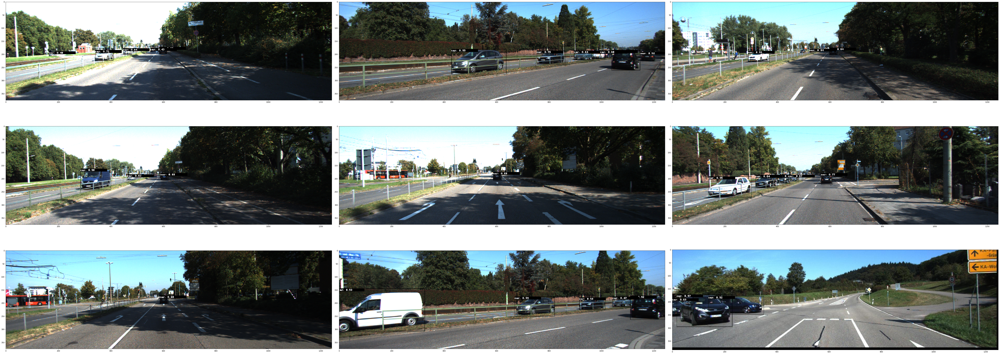

In [32]:
# Visualizing the sample images.
OUTPUT_PATH = 'ssd_infer_images' # relative path from $USER_EXPERIMENT_DIR.
COLS = 3 # number of columns in the visualizer grid.
IMAGES = 9 # number of images to visualize.

visualize_images(OUTPUT_PATH, num_cols=COLS, num_images=IMAGES)

## 9. Deploy! <a class="anchor" id="head-9"></a>

![export](tlt_figures/TLT-6_export.PNG)

In [33]:
!mkdir -p $USER_EXPERIMENT_DIR/export
# Export in FP32 mode. 
!tlt-export $USER_EXPERIMENT_DIR/experiment_dir_retrain/weights/ssd_resnet18_epoch_180.tlt \
            -k $KEY \
            -o $USER_EXPERIMENT_DIR/export/ssd_resnet18_epoch_180.etlt \
            --outputs NMS \
            -e $SPECS_DIR/ssd_retrain_resnet18_kitti.txt \
            --export_module ssd


Using TensorFlow backend.
2019-10-22 15:26:21,015 [INFO] iva.ssd.scripts.export: Loading experiment spec at /workspace/examples/ssd/specs/ssd_retrain_resnet18_kitti.txt.
2019-10-22 15:26:21,015 [INFO] /usr/local/lib/python2.7/dist-packages/iva/ssd/utils/spec_loader.pyc: Merging specification from /workspace/examples/ssd/specs/ssd_retrain_resnet18_kitti.txt
2019-10-22 15:26:21.018886: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2019-10-22 15:26:22.322334: I tensorflow/compiler/xla/service/service.cc:150] XLA service 0x5a308f0 executing computations on platform CUDA. Devices:
2019-10-22 15:26:22.322378: I tensorflow/compiler/xla/service/service.cc:158]   StreamExecutor device (0): Tesla V100-SXM2-16GB, Compute Capability 7.0
2019-10-22 15:26:22.322387: I tensorflow/compiler/xla/service/service.cc:158]   StreamExecutor device (1): Tesla V100-SXM2-16GB, Compute Capability 7.0
2019-10-22 15

2019-10-22 15:26:27.388067: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1512] Adding visible gpu devices: 0, 1, 2, 3, 4, 5, 6, 7
2019-10-22 15:26:27.389261: I tensorflow/core/common_runtime/gpu/gpu_device.cc:984] Device interconnect StreamExecutor with strength 1 edge matrix:
2019-10-22 15:26:27.389279: I tensorflow/core/common_runtime/gpu/gpu_device.cc:990]      0 1 2 3 4 5 6 7 
2019-10-22 15:26:27.389288: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1003] 0:   N Y Y Y Y N N N 
2019-10-22 15:26:27.389295: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1003] 1:   Y N Y Y N Y N N 
2019-10-22 15:26:27.389302: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1003] 2:   Y Y N Y N N Y N 
2019-10-22 15:26:27.389310: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1003] 3:   Y Y Y N N N N Y 
2019-10-22 15:26:27.389335: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1003] 4:   Y N N N N Y Y Y 
2019-10-22 15:26:27.389343: I tensorflow/core/common_runtime/gpu/gpu_device

2019-10-22 15:26:39.824689: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1512] Adding visible gpu devices: 0, 1, 2, 3, 4, 5, 6, 7
2019-10-22 15:26:39.825893: I tensorflow/core/common_runtime/gpu/gpu_device.cc:984] Device interconnect StreamExecutor with strength 1 edge matrix:
2019-10-22 15:26:39.825912: I tensorflow/core/common_runtime/gpu/gpu_device.cc:990]      0 1 2 3 4 5 6 7 
2019-10-22 15:26:39.825923: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1003] 0:   N Y Y Y Y N N N 
2019-10-22 15:26:39.825950: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1003] 1:   Y N Y Y N Y N N 
2019-10-22 15:26:39.825959: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1003] 2:   Y Y N Y N N Y N 
2019-10-22 15:26:39.825968: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1003] 3:   Y Y Y N N N N Y 
2019-10-22 15:26:39.825977: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1003] 4:   Y N N N N Y Y Y 
2019-10-22 15:26:39.825985: I tensorflow/core/common_runtime/gpu/gpu_device

In [34]:
print('Exported model:')
print('------------')
!ls -lh $USER_EXPERIMENT_DIR/export

Exported model:
------------
total 154M
-rwxrwxrwx 1 root root  54M Oct 22 15:26 ssd_resnet18_epoch_180.etlt
-rwxrwxrwx 1 root root 101M Oct 22 14:55 trt.engine


## 10. Convert TRT <a class="anchor" id="head-10"></a>

![Convert TRT](tlt_figures/TLT-7_trt_conversion.PNG)

In [35]:
# Convert to TensorRT engine
!tlt-converter -k $KEY \
               -d 3,384,1248 \
               -o NMS \
               -e $USER_EXPERIMENT_DIR/export/trt.engine \
               $USER_EXPERIMENT_DIR/export/ssd_resnet18_epoch_180.etlt

[INFO] UFFParser: parsing Input
[INFO] UFFParser: Applying order forwarding to: Input
[INFO] UFFParser: parsing conv1/kernel
[INFO] UFFParser: Applying order forwarding to: conv1/kernel
[INFO] UFFParser: parsing conv1/convolution
[INFO] UFFParser: Applying order forwarding to: conv1/convolution
[INFO] UFFParser: parsing conv1/bias
[INFO] UFFParser: Applying order forwarding to: conv1/bias
[INFO] UFFParser: parsing conv1/BiasAdd
[INFO] UFFParser: Applying order forwarding to: conv1/BiasAdd
[INFO] UFFParser: parsing bn_conv1/moving_variance
[INFO] UFFParser: Applying order forwarding to: bn_conv1/moving_variance
[INFO] UFFParser: parsing bn_conv1/Reshape_1/shape
[INFO] UFFParser: Applying order forwarding to: bn_conv1/Reshape_1/shape
[INFO] UFFParser: parsing bn_conv1/Reshape_1
[INFO] UFFParser: Applying order forwarding to: bn_conv1/Reshape_1
[INFO] UFFParser: parsing bn_conv1/batchnorm/add/y
[INFO] UFFParser: Applying order forwarding to: bn_conv1/batchnorm/add/y
[INFO] UFFParser: pars

[INFO] UFFParser: Applying order forwarding to: block_2b_conv_2/convolution
[INFO] UFFParser: parsing block_2b_conv_2/bias
[INFO] UFFParser: Applying order forwarding to: block_2b_conv_2/bias
[INFO] UFFParser: parsing block_2b_conv_2/BiasAdd
[INFO] UFFParser: Applying order forwarding to: block_2b_conv_2/BiasAdd
[INFO] UFFParser: parsing block_2b_bn_2/moving_variance
[INFO] UFFParser: Applying order forwarding to: block_2b_bn_2/moving_variance
[INFO] UFFParser: parsing block_2b_bn_2/Reshape_1/shape
[INFO] UFFParser: Applying order forwarding to: block_2b_bn_2/Reshape_1/shape
[INFO] UFFParser: parsing block_2b_bn_2/Reshape_1
[INFO] UFFParser: Applying order forwarding to: block_2b_bn_2/Reshape_1
[INFO] UFFParser: parsing block_2b_bn_2/batchnorm/add/y
[INFO] UFFParser: Applying order forwarding to: block_2b_bn_2/batchnorm/add/y
[INFO] UFFParser: parsing block_2b_bn_2/batchnorm/add
[INFO] UFFParser: Applying order forwarding to: block_2b_bn_2/batchnorm/add
[INFO] UFFParser: parsing block_

[INFO] UFFParser: Applying order forwarding to: block_4a_conv_1/kernel
[INFO] UFFParser: parsing block_4a_conv_1/convolution
[INFO] UFFParser: Applying order forwarding to: block_4a_conv_1/convolution
[INFO] UFFParser: parsing block_4a_conv_1/bias
[INFO] UFFParser: Applying order forwarding to: block_4a_conv_1/bias
[INFO] UFFParser: parsing block_4a_conv_1/BiasAdd
[INFO] UFFParser: Applying order forwarding to: block_4a_conv_1/BiasAdd
[INFO] UFFParser: parsing block_4a_bn_1/moving_variance
[INFO] UFFParser: Applying order forwarding to: block_4a_bn_1/moving_variance
[INFO] UFFParser: parsing block_4a_bn_1/Reshape_1/shape
[INFO] UFFParser: Applying order forwarding to: block_4a_bn_1/Reshape_1/shape
[INFO] UFFParser: parsing block_4a_bn_1/Reshape_1
[INFO] UFFParser: Applying order forwarding to: block_4a_bn_1/Reshape_1
[INFO] UFFParser: parsing block_4a_bn_1/batchnorm/add/y
[INFO] UFFParser: Applying order forwarding to: block_4a_bn_1/batchnorm/add/y
[INFO] UFFParser: parsing block_4a_bn

[INFO] UFFParser: Applying order forwarding to: block_4b_conv_1/convolution
[INFO] UFFParser: parsing block_4b_conv_1/bias
[INFO] UFFParser: Applying order forwarding to: block_4b_conv_1/bias
[INFO] UFFParser: parsing block_4b_conv_1/BiasAdd
[INFO] UFFParser: Applying order forwarding to: block_4b_conv_1/BiasAdd
[INFO] UFFParser: parsing block_4b_bn_1/moving_variance
[INFO] UFFParser: Applying order forwarding to: block_4b_bn_1/moving_variance
[INFO] UFFParser: parsing block_4b_bn_1/Reshape_1/shape
[INFO] UFFParser: Applying order forwarding to: block_4b_bn_1/Reshape_1/shape
[INFO] UFFParser: parsing block_4b_bn_1/Reshape_1
[INFO] UFFParser: Applying order forwarding to: block_4b_bn_1/Reshape_1
[INFO] UFFParser: parsing block_4b_bn_1/batchnorm/add/y
[INFO] UFFParser: Applying order forwarding to: block_4b_bn_1/batchnorm/add/y
[INFO] UFFParser: parsing block_4b_bn_1/batchnorm/add
[INFO] UFFParser: Applying order forwarding to: block_4b_bn_1/batchnorm/add
[INFO] UFFParser: parsing block_

[INFO] UFFParser: Applying order forwarding to: expand_conv2/convolution
[INFO] UFFParser: parsing expand_conv2/bias
[INFO] UFFParser: Applying order forwarding to: expand_conv2/bias
[INFO] UFFParser: parsing expand_conv2/BiasAdd
[INFO] UFFParser: Applying order forwarding to: expand_conv2/BiasAdd
[INFO] UFFParser: parsing expand2_relu/Relu6
[INFO] Setting dynamic range for (Unnamed Layer* 435) [Activation]_output to [0,6]
[INFO] UFFParser: Applying order forwarding to: expand2_relu/Relu6
[INFO] UFFParser: parsing additional_map0_0/kernel
[INFO] UFFParser: Applying order forwarding to: additional_map0_0/kernel
[INFO] UFFParser: parsing additional_map0_0/convolution
[INFO] UFFParser: Applying order forwarding to: additional_map0_0/convolution
[INFO] UFFParser: parsing additional_map0_0/bias
[INFO] UFFParser: Applying order forwarding to: additional_map0_0/bias
[INFO] UFFParser: parsing additional_map0_0/BiasAdd
[INFO] UFFParser: Applying order forwarding to: additional_map0_0/BiasAdd
[I

[INFO] Applying generic optimizations to the graph for inference.
[INFO] Original: 694 layers
[INFO] After dead-layer removal: 243 layers
[INFO] Fusing convolution weights from conv1/convolution with scale conv1/BiasAdd
[INFO] Fusing convolution weights from conv1/convolution with scale bn_conv1/batchnorm/mul_1
[INFO] Fusing convolution weights from conv1/convolution with scale bn_conv1/batchnorm/add_1
[INFO] Fusing convolution weights from block_1a_conv_1/convolution with scale block_1a_conv_1/BiasAdd
[INFO] Fusing convolution weights from block_1a_conv_1/convolution with scale block_1a_bn_1/batchnorm/mul_1
[INFO] Fusing convolution weights from block_1a_conv_1/convolution with scale block_1a_bn_1/batchnorm/add_1
[INFO] Fusing convolution weights from block_1a_conv_2/convolution with scale block_1a_conv_2/BiasAdd
[INFO] Fusing convolution weights from block_1a_conv_2/convolution with scale block_1a_bn_2/batchnorm/mul_1
[INFO] Fusing convolution weights from block_1a_conv_2/convolution

[INFO] After scale fusion: 146 layers
[INFO] Fusing conv1/convolution with activation_35/Relu
[INFO] Fusing block_1a_conv_1/convolution with activation_36/Relu
[INFO] Fusing block_1a_conv_2/convolution with add_17/add
[INFO] Fusing block_1a_conv_2/convolution + add_17/add with activation_37/Relu
[INFO] Fusing block_1b_conv_1/convolution with activation_38/Relu
[INFO] Fusing block_1b_conv_2/convolution with add_18/add
[INFO] Fusing block_1b_conv_2/convolution + add_18/add with activation_39/Relu
[INFO] Fusing block_2a_conv_1/convolution with activation_40/Relu
[INFO] Fusing block_2a_conv_2/convolution with add_19/add
[INFO] Fusing block_2a_conv_2/convolution + add_19/add with activation_41/Relu
[INFO] Fusing block_2b_conv_1/convolution with activation_42/Relu
[INFO] Fusing block_2b_conv_2/convolution with add_20/add
[INFO] Fusing block_2b_conv_2/convolution + add_20/add with activation_43/Relu
[INFO] Fusing block_3a_conv_1/convolution with activation_44/Relu
[INFO] Fusing block_3a_conv_

[INFO] Tactic -3120440365138571960 time 0.338944
[INFO] Tactic -242550410056126076 time 0.400384
[INFO] 
[INFO] --------------- Timing block_1a_conv_shortcut/convolution(1)
[INFO] Tactic 0 time 0.930816
[INFO] Tactic 1 time 0.668672
[INFO] Tactic 2 time 1.08544
[INFO] Tactic 5 time 6.46042
[INFO] 
[INFO] --------------- Timing block_1a_conv_shortcut/convolution(33)
[INFO] --------------- Chose 14 (-3448915218022119398)
[INFO] 
[INFO] --------------- Timing block_1a_conv_2/convolution + add_17/add + activation_37/Relu(3)
[INFO] 
[INFO] --------------- Timing block_1a_conv_2/convolution + add_17/add + activation_37/Relu(14)
[INFO] Tactic 313790760974845026 time 1.85856
[INFO] Tactic 4840826699149504854 time 5.01658
[INFO] Tactic 5144900180810042977 time 2.62451
[INFO] Tactic 7995089803833173579 time 2.4791
[INFO] Tactic 8967263056866968576 time 2.45555
[INFO] Tactic -9018593586369639207 time 4.76774
[INFO] Tactic -3998689942157953075 time 4.73907
[INFO] Tactic -3448915218022119398 time 2

[INFO] Tactic 2 time 0.735232
[INFO] Tactic 4 scratch requested: 9132048384, available: 1073741824
[INFO] Tactic 5 time 1.30253
[INFO] 
[INFO] --------------- Timing block_2b_conv_shortcut/convolution(33)
[INFO] --------------- Chose 14 (-3120440365138571960)
[INFO] 
[INFO] --------------- Timing block_2b_conv_2/convolution + add_20/add + activation_43/Relu(3)
[INFO] 
[INFO] --------------- Timing block_2b_conv_2/convolution + add_20/add + activation_43/Relu(14)
[INFO] Tactic 313790760974845026 time 1.39571
[INFO] Tactic 4840826699149504854 time 2.52928
[INFO] Tactic 5144900180810042977 time 2.64909
[INFO] Tactic 7995089803833173579 time 2.45555
[INFO] Tactic 8967263056866968576 time 2.40333
[INFO] Tactic -9018593586369639207 time 2.37363
[INFO] Tactic -3998689942157953075 time 2.36339
[INFO] Tactic -3448915218022119398 time 2.42688
[INFO] 
[INFO] --------------- Timing block_2b_conv_2/convolution + add_20/add + activation_43/Relu(1)
[INFO] Tactic 0 time 3.37203
[INFO] Tactic 1 time 2.

[INFO] Tactic -9018593586369639207 time 4.54861
[INFO] Tactic -3998689942157953075 time 4.52096
[INFO] Tactic -3448915218022119398 time 4.65715
[INFO] 
[INFO] --------------- Timing block_4a_conv_1/convolution + activation_48/Relu(1)
[INFO] Tactic 0 time 5.46918
[INFO] Tactic 1 time 4.97459
[INFO] Tactic 2 time 5.80198
[INFO] Tactic 4 scratch requested: 17435836416, available: 1073741824
[INFO] Tactic 5 time 4.63565
[INFO] Tactic 6 time 2.92966
[INFO] 
[INFO] --------------- Timing block_4a_conv_1/convolution + activation_48/Relu(33)
[INFO] --------------- Chose 14 (313790760974845026)
[INFO] 
[INFO] --------------- Timing block_4a_conv_shortcut/convolution(3)
[INFO] 
[INFO] --------------- Timing block_4a_conv_shortcut/convolution(14)
[INFO] Tactic 5144900180810042977 time 0.74752
[INFO] Tactic 7995089803833173579 time 0.5632
[INFO] Tactic -9018593586369639207 time 0.577536
[INFO] Tactic -8109134417363526151 time 0.681984
[INFO] Tactic -3998689942157953075 time 0.576512
[INFO] Tactic 

[INFO] Tactic -9018593586369639207 time 1.07622
[INFO] Tactic -8109134417363526151 time 1.19808
[INFO] Tactic -3998689942157953075 time 1.07213
[INFO] Tactic -3448915218022119398 time 1.10387
[INFO] Tactic -3120440365138571960 time 1.06906
[INFO] Tactic -242550410056126076 time 1.07418
[INFO] 
[INFO] --------------- Timing additional_map0_0/convolution + additional_map0_0_relu/Relu6(1)
[INFO] Tactic 0 time 1.41517
[INFO] Tactic 1 time 1.24416
[INFO] Tactic 2 time 1.71725
[INFO] Tactic 4 scratch requested: 37078695936, available: 1073741824
[INFO] Tactic 5 time 3.23379
[INFO] 
[INFO] --------------- Timing additional_map0_0/convolution + additional_map0_0_relu/Relu6(33)
[INFO] --------------- Chose 14 (-3120440365138571960)
[INFO] 
[INFO] --------------- Timing additional_map0_1/convolution + additional_map0_1_relu/Relu6(3)
[INFO] 
[INFO] --------------- Timing additional_map0_1/convolution + additional_map0_1_relu/Relu6(14)
[INFO] Tactic 4840826699149504854 time 1.21958
[INFO] Tactic 5

[INFO] Tactic 1 time 0.233472
[INFO] Tactic 2 time 0.140288
[INFO] Tactic 4 time 0.067584
[INFO] Tactic 5 time 0.364544
[INFO] Tactic 6 time 0.064512
[INFO] 
[INFO] --------------- Timing ssd_loc_4/convolution(33)
[INFO] --------------- Chose 14 (313790760974845026)
[INFO] 
[INFO] --------------- Timing <reformat>(9)
[INFO] Tactic 0 time 0.007168
[INFO] 
[INFO] --------------- Timing anchor_reshape_4/Reshape(19)
[INFO] Tactic 0 is the only option, timing skipped
[INFO] 
[INFO] --------------- Timing additional_map3_0/convolution + additional_map3_0_relu/Relu6(3)
[INFO] 
[INFO] --------------- Timing additional_map3_0/convolution + additional_map3_0_relu/Relu6(14)
[INFO] Tactic 5144900180810042977 time 0.064512
[INFO] Tactic 7995089803833173579 time 0.045056
[INFO] Tactic -9018593586369639207 time 0.05632
[INFO] Tactic -8109134417363526151 time 0.064512
[INFO] Tactic -3998689942157953075 time 0.05632
[INFO] Tactic -3448915218022119398 time 0.044032
[INFO] Tactic -3120440365138571960 tim

[INFO] Tactic 4840826699149504854 time 0.463872
[INFO] Tactic 5144900180810042977 time 0.356352
[INFO] Tactic 7995089803833173579 time 0.342016
[INFO] Tactic 8967263056866968576 time 0.316416
[INFO] Tactic -9018593586369639207 time 0.4608
[INFO] Tactic -3998689942157953075 time 0.401408
[INFO] Tactic -3448915218022119398 time 0.2304
[INFO] 
[INFO] --------------- Timing ssd_conf_4/convolution(1)
[INFO] Tactic 0 time 0.120832
[INFO] Tactic 1 time 0.233472
[INFO] Tactic 2 time 0.135168
[INFO] Tactic 4 time 0.063488
[INFO] Tactic 5 time 0.351232
[INFO] Tactic 6 time 0.063488
[INFO] 
[INFO] --------------- Timing ssd_conf_4/convolution(33)
[INFO] --------------- Chose 14 (313790760974845026)
[INFO] 
[INFO] --------------- Timing permute_33/transpose + (Unnamed Layer* 670) [Shuffle] + conf_reshape_4/Reshape(19)
[INFO] Tactic 0 is the only option, timing skipped
[INFO] 
[INFO] --------------- Timing ssd_conf_5/convolution(3)
[INFO] 
[INFO] --------------- Timing ssd_conf_5/convolution(14)
[I

In [36]:
print('Exported engine:')
print('------------')
!ls -lh $USER_EXPERIMENT_DIR/export/trt.engine

Exported engine:
------------
-rwxrwxrwx 1 root root 101M Oct 22 15:26 /workspace/tlt-experiments/export/trt.engine


## 11. References <a class="anchor" id="head-11"></a>

- [Transfer Learning Toolkit blog](https://developer.nvidia.com/transfer-learning-toolkit)
- [Getting Started Guide](https://docs.nvidia.com/metropolis/TLT/tlt-getting-started-guide/index.html)
- [Tutorial](https://medium.com/dataseries/build-and-deploy-accurate-deep-learning-models-for-intelligent-image-and-video-analytics-8ad755213c06)
- [What is Transfer Learning?](https://blogs.nvidia.com/blog/2019/02/07/what-is-transfer-learning/)
- [Pruning Models with Transfer Learning Toolkit](https://devblogs.nvidia.com/transfer-learning-toolkit-pruning-intelligent-video-analytics/)
